In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import random
from IPython.display import display
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()


import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

#import sys
#!{sys.executable} -m pip install pandas-profiling 
#!{sys.executable} -m pip install -U phik 
#!{sys.executable} -m pip install geopandas

import pandas_profiling
from pandas_profiling import profile_report

#import geopandas as gp

C:\Users\prajj\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [3]:
data = pd.read_csv("D:\\DataBases\\SolarRadiationPrediction\\SolarPrediction.csv")

In [5]:
data.head(5)

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


In [14]:
data.describe()

,UNIXTime,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed
count,3.268600e+04,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000,32686.000000
mean,1.478047e+09,207.124697,51.103255,30.422879,75.016307,143.489821,6.243869
std,3.005037e+06,315.916387,6.201157,0.054673,25.990219,83.167500,3.490474
min,1.472724e+09,1.110000,34.000000,30.190000,8.000000,0.090000,0.000000
25%,1.475546e+09,1.230000,46.000000,30.400000,56.000000,82.227500,3.370000
50%,1.478026e+09,2.660000,50.000000,30.430000,85.000000,147.700000,5.620000
75%,1.480480e+09,354.235000,55.000000,30.460000,97.000000,179.310000,7.870000
max,1.483265e+09,1601.260000,71.000000,30.560000,103.000000,359.950000,40.500000


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32686 entries, 0 to 32685
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   UNIXTime                32686 non-null  int64  
 1   Data                    32686 non-null  object 
 2   Time                    32686 non-null  object 
 3   Radiation               32686 non-null  float64
 4   Temperature             32686 non-null  int64  
 5   Pressure                32686 non-null  float64
 6   Humidity                32686 non-null  int64  
 7   WindDirection(Degrees)  32686 non-null  float64
 8   Speed                   32686 non-null  float64
 9   TimeSunRise             32686 non-null  object 
 10  TimeSunSet              32686 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 2.7+ MB


In [6]:
data.profile_report(title='Pandas Profiling of SolarRadiation Dataset',html={'style':{'full_width':True}})

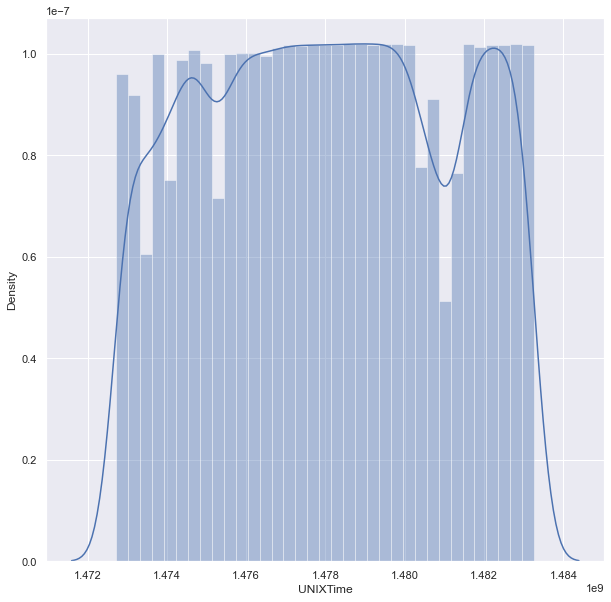

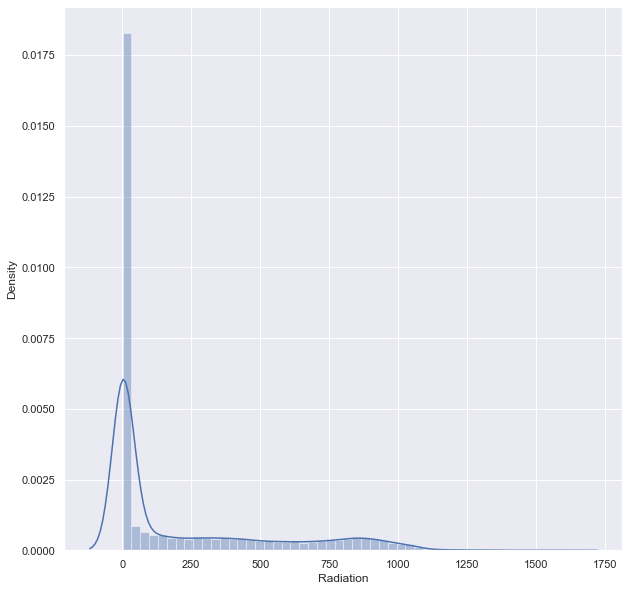

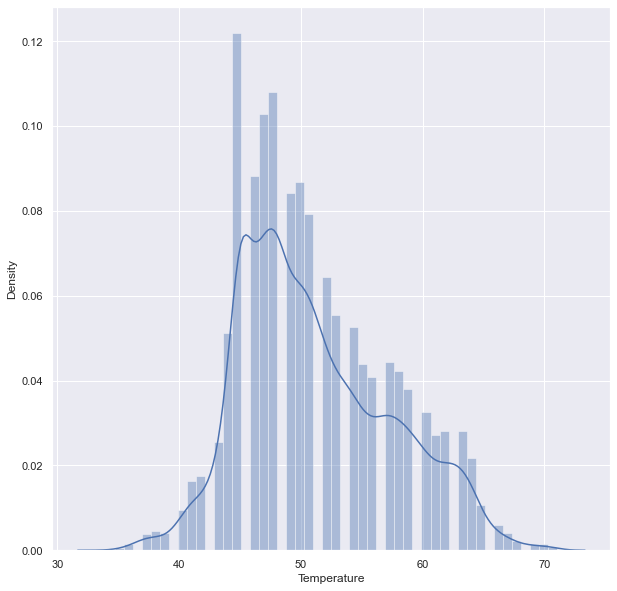

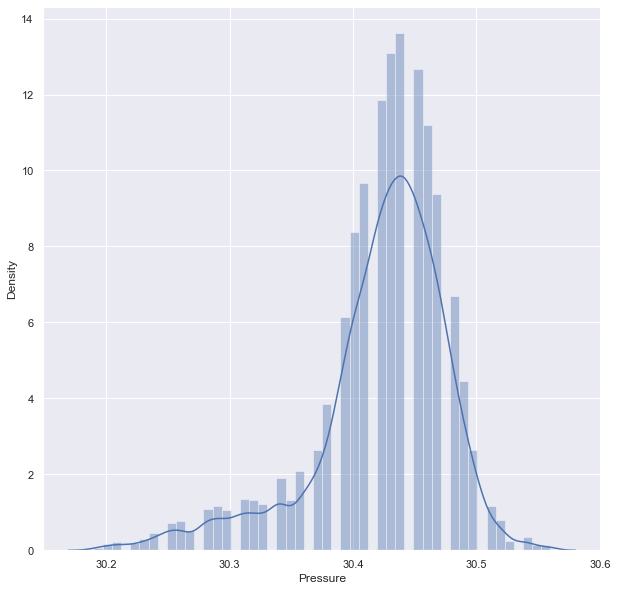

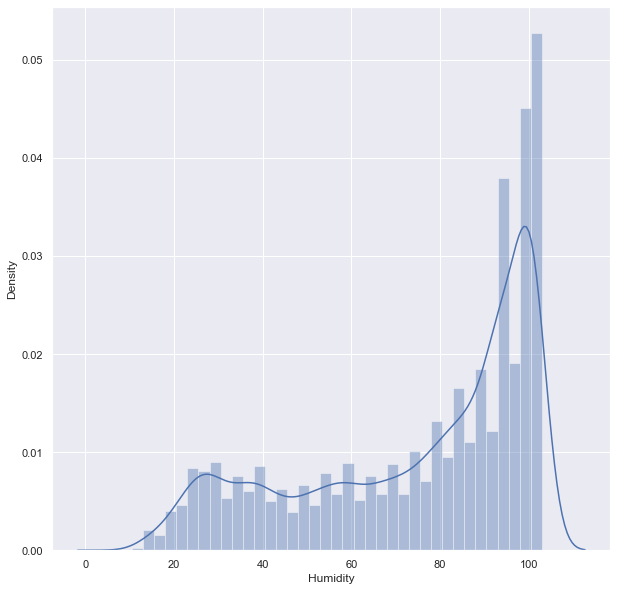

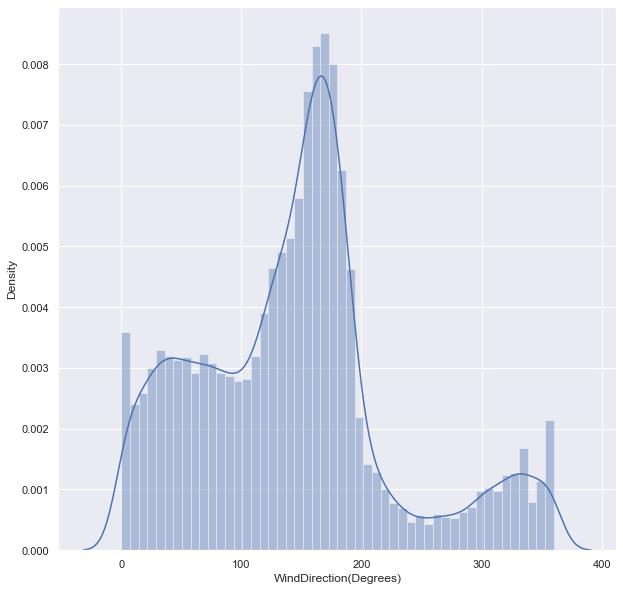

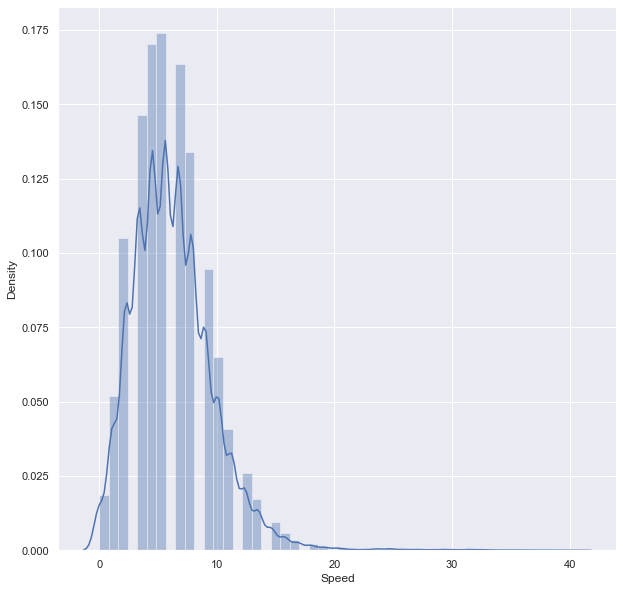

In [14]:
sns.set(rc={'figure.figsize':(10,10)})
for idx in data.columns:
    dataTypeObj = data.dtypes[idx]
    if dataTypeObj == np.object:
        continue
    sns.distplot(data[idx])
    path = 'D:\\dev\\DataAnalysis\\DataAnalysis\\' + idx + '.png' #concatenating the path '//' is required for escaping single '/' 
    plt.savefig(path)                                             #printing to file
    plt.show()

In [19]:
data.head(5)

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


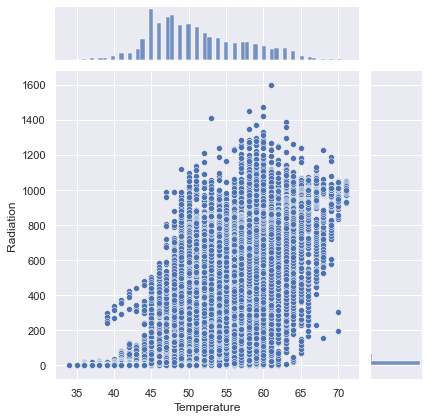

In [18]:
sns.jointplot(data=data, x=data['Temperature'], y=data['Radiation'])

<Figure size 3600x3600 with 0 Axes>

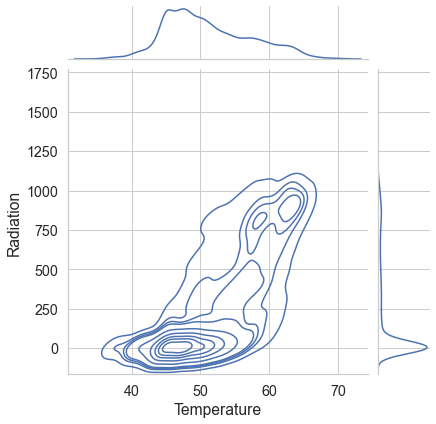

In [6]:
plt.figure(figsize=(50,50))
sns.jointplot(
    data=data,
    x=data['Temperature'], y=data['Radiation'],
    kind="kde"
)

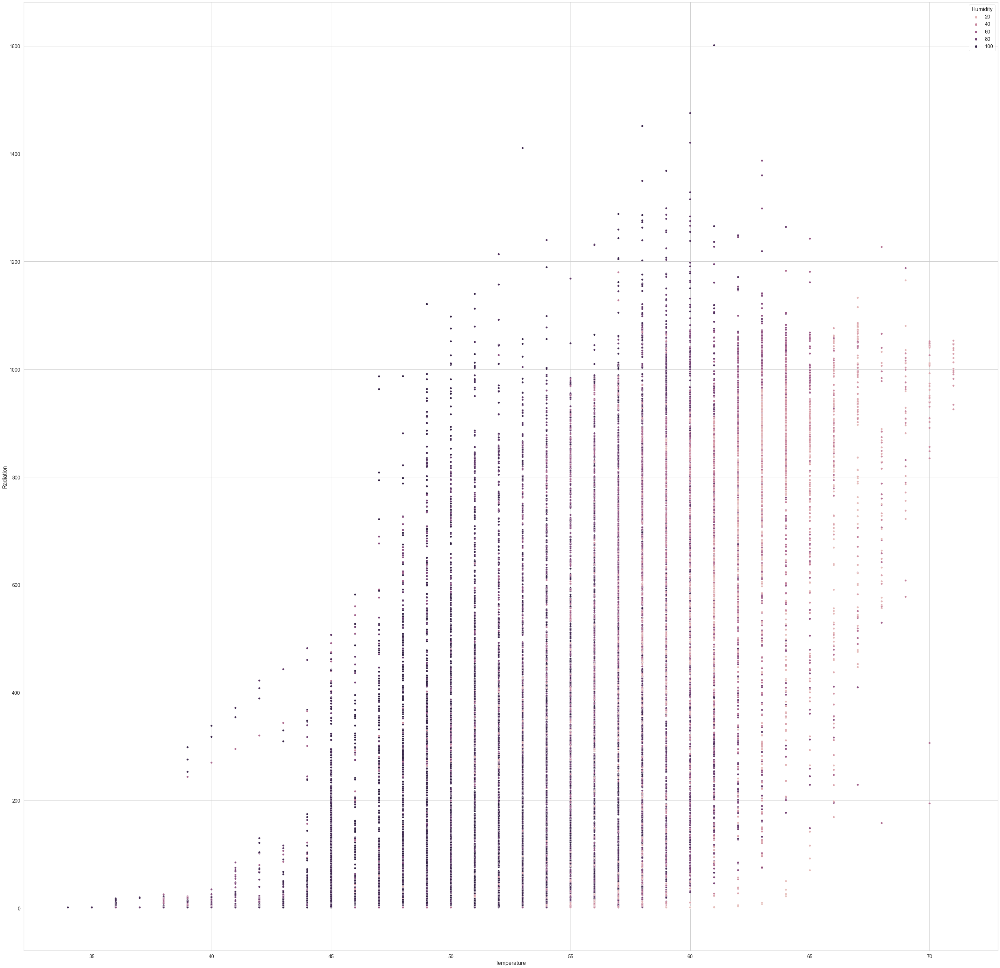

In [13]:
plt.figure(figsize=(50,50))
sns.scatterplot(data=data, x=data['Temperature'], y=data['Radiation'], hue=data['Humidity'])
plt.savefig("D:\\dev\\DataAnalysis\\DataAnalysis\\Temp-Rad-HUE-Humidity.png") 
plt.show()

<Figure size 3600x3600 with 0 Axes>

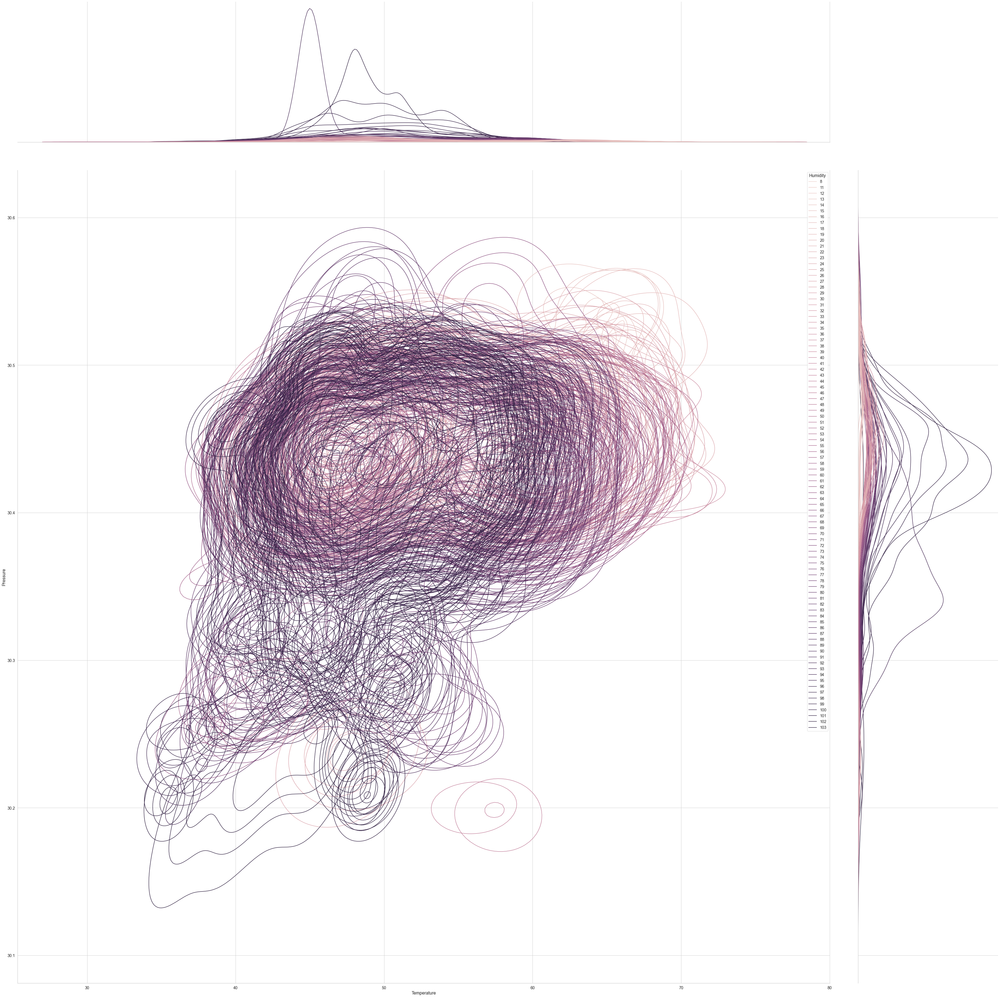

In [30]:
plt.figure(figsize=(50,50))
sns.jointplot(
    data=data,
    x=data['Temperature'], y=data['Pressure'], hue=data['Humidity'],
    kind="kde", height=50
)

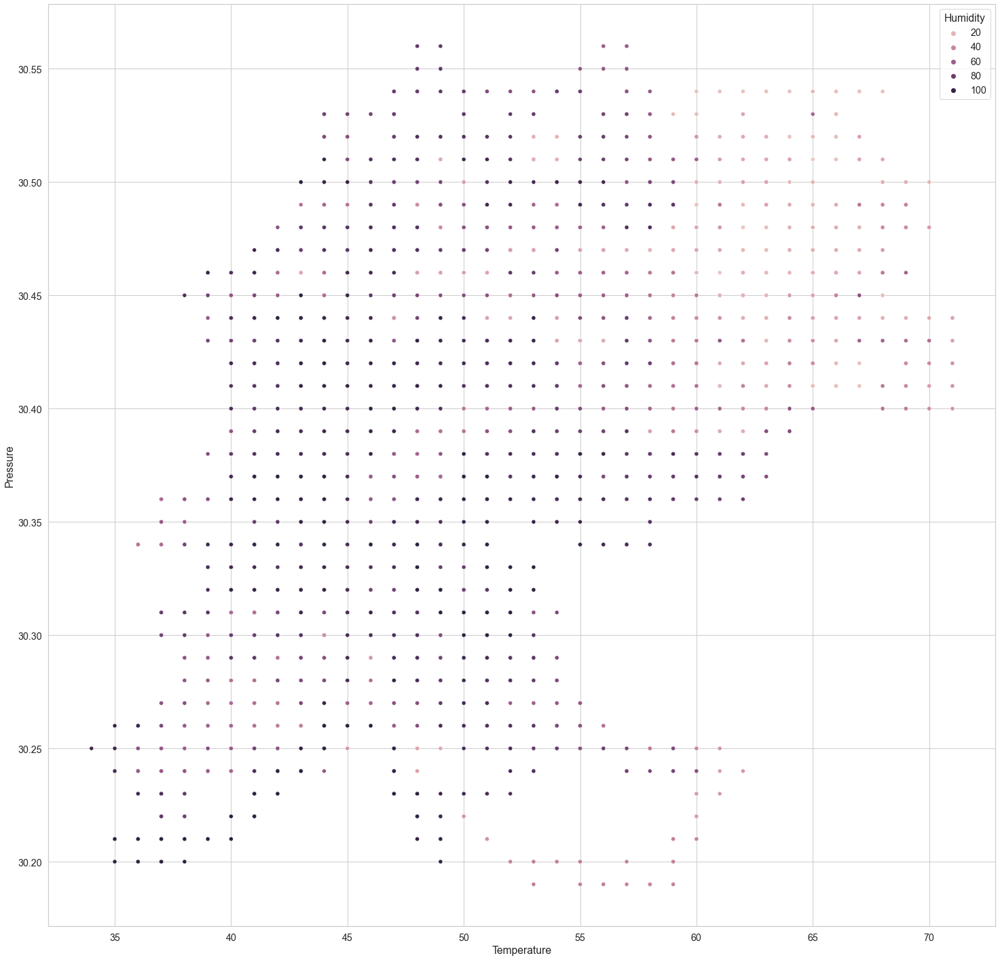

In [15]:
plt.figure(figsize=(25,25))
sns.scatterplot(data=data, x=data['Temperature'], y=data['Pressure'], hue=data['Humidity'])
plt.savefig("D:\\dev\\DataAnalysis\\DataAnalysis\\Temp-Pressure-HUE-Humidity.png") 
plt.show()

<Figure size 3600x3600 with 0 Axes>

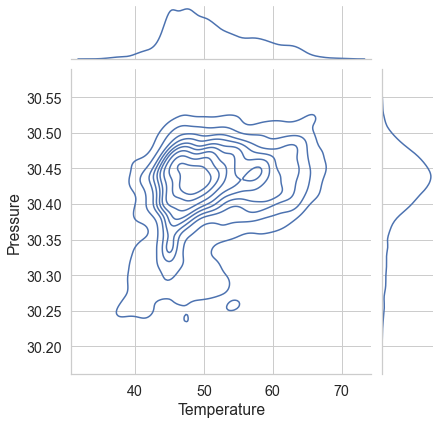

In [11]:
plt.figure(figsize=(50,50))
sns.jointplot(
    data=data,
    x=data['Temperature'], y=data['Pressure'],
    kind="kde"
)

In [16]:
data.head(5)

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


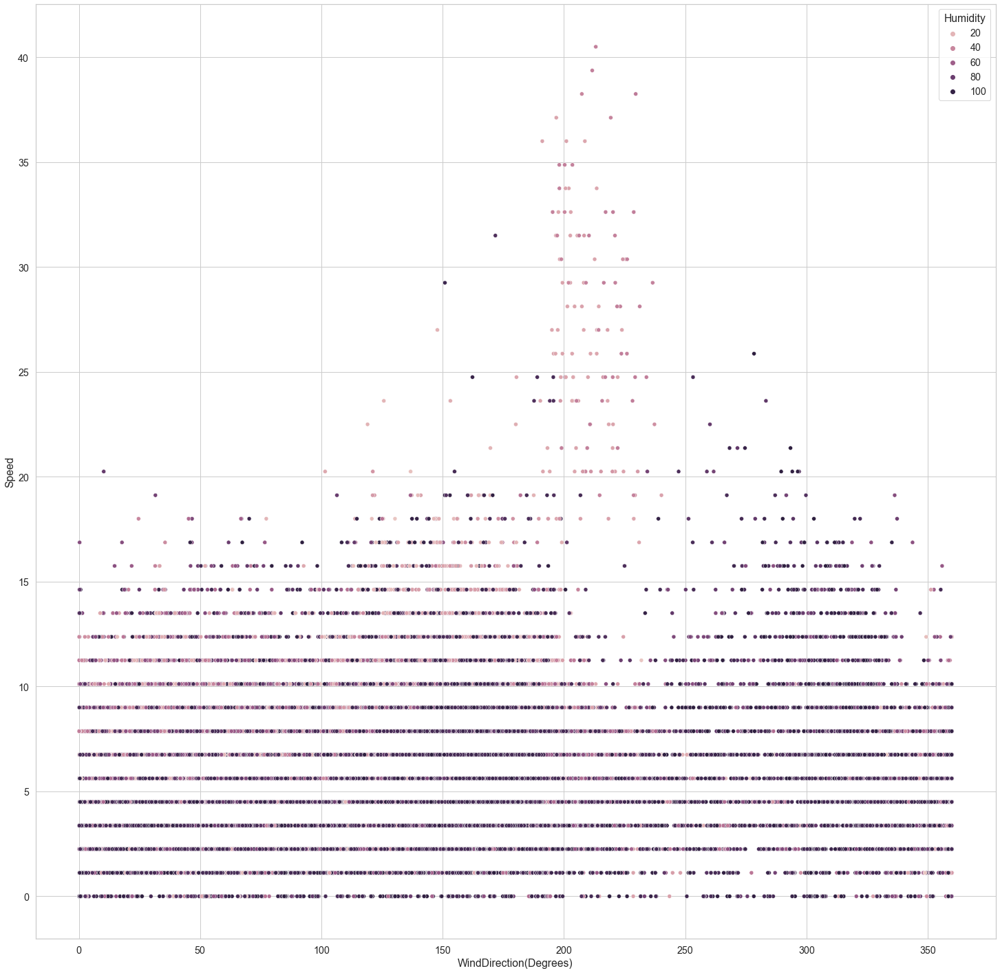

In [17]:
plt.figure(figsize=(25,25))
sns.scatterplot(data=data, x=data['WindDirection(Degrees)'], y=data['Speed'], hue=data['Humidity'])
plt.savefig("D:\\dev\\DataAnalysis\\DataAnalysis\\WindDirection(Degrees)-Speed-HUE-Humidity.png") 
plt.show()

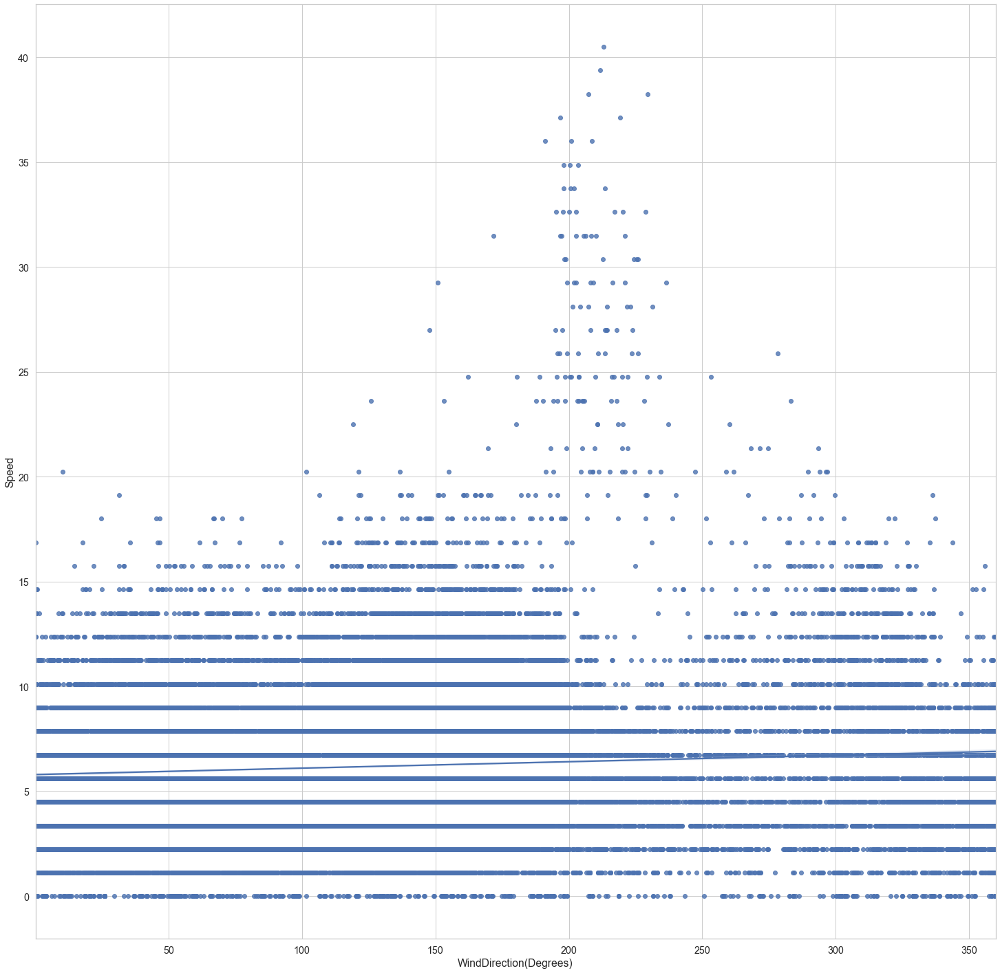

In [20]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['WindDirection(Degrees)'], y=data['Speed'], data=data);

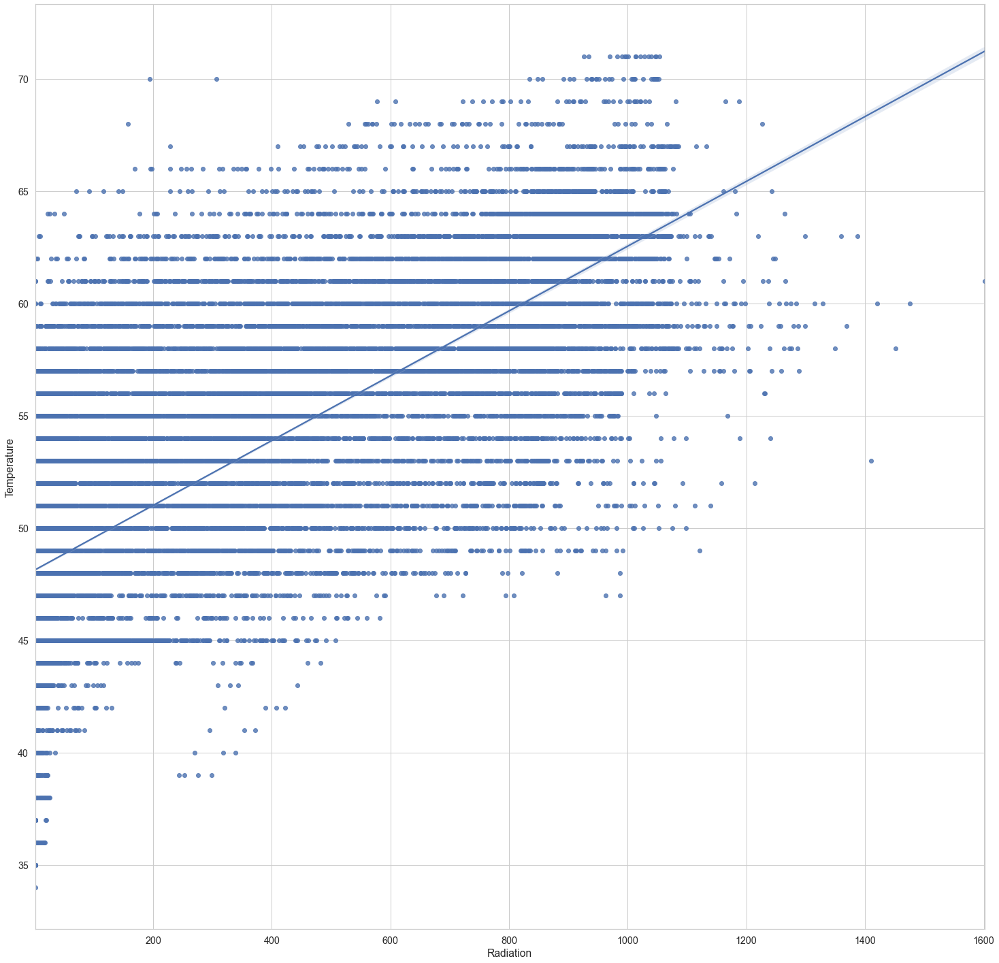

In [21]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['Radiation'], y=data['Temperature'], data=data);

<AxesSubplot:xlabel='Temperature', ylabel='Pressure'>

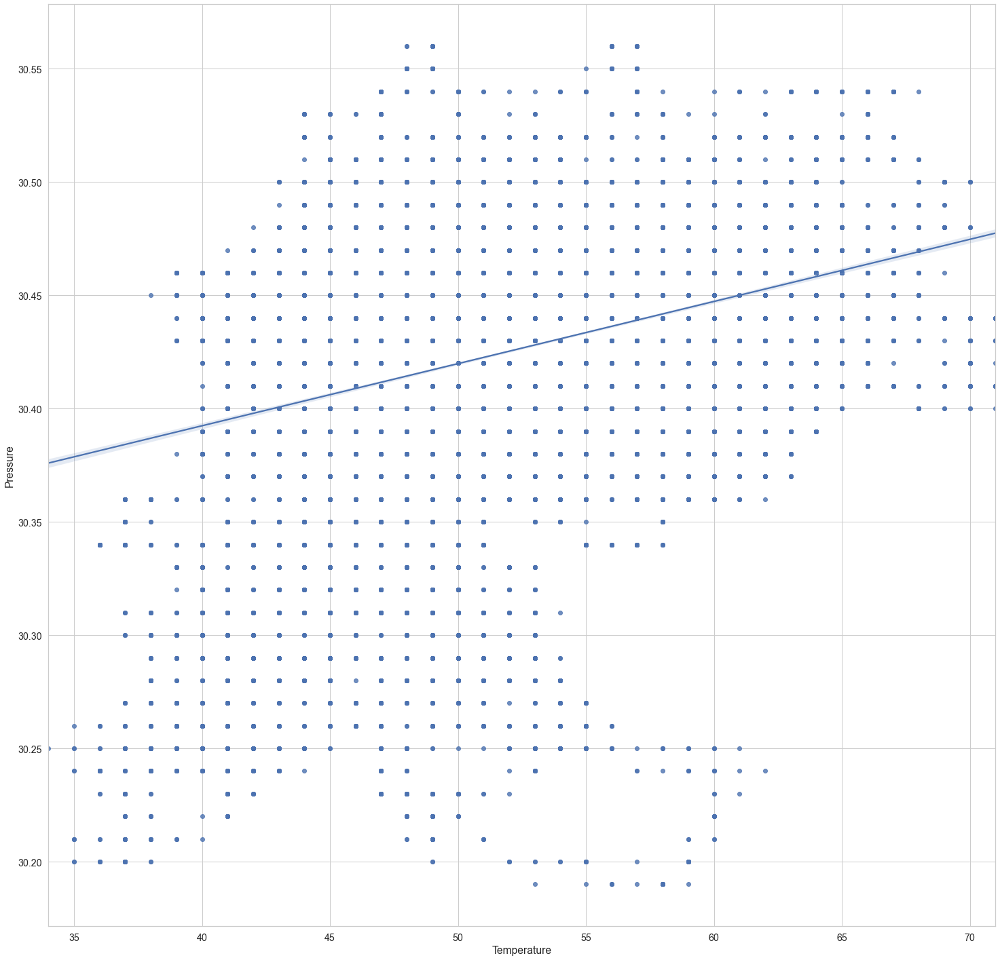

In [22]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['Temperature'],y=data['Pressure'],data=data)

In [23]:
data.head(5)

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
0,1475229326,9/29/2016 12:00:00 AM,23:55:26,1.21,48,30.46,59,177.39,5.62,06:13:00,18:13:00
1,1475229023,9/29/2016 12:00:00 AM,23:50:23,1.21,48,30.46,58,176.78,3.37,06:13:00,18:13:00
2,1475228726,9/29/2016 12:00:00 AM,23:45:26,1.23,48,30.46,57,158.75,3.37,06:13:00,18:13:00
3,1475228421,9/29/2016 12:00:00 AM,23:40:21,1.21,48,30.46,60,137.71,3.37,06:13:00,18:13:00
4,1475228124,9/29/2016 12:00:00 AM,23:35:24,1.17,48,30.46,62,104.95,5.62,06:13:00,18:13:00


<AxesSubplot:xlabel='Pressure', ylabel='Humidity'>

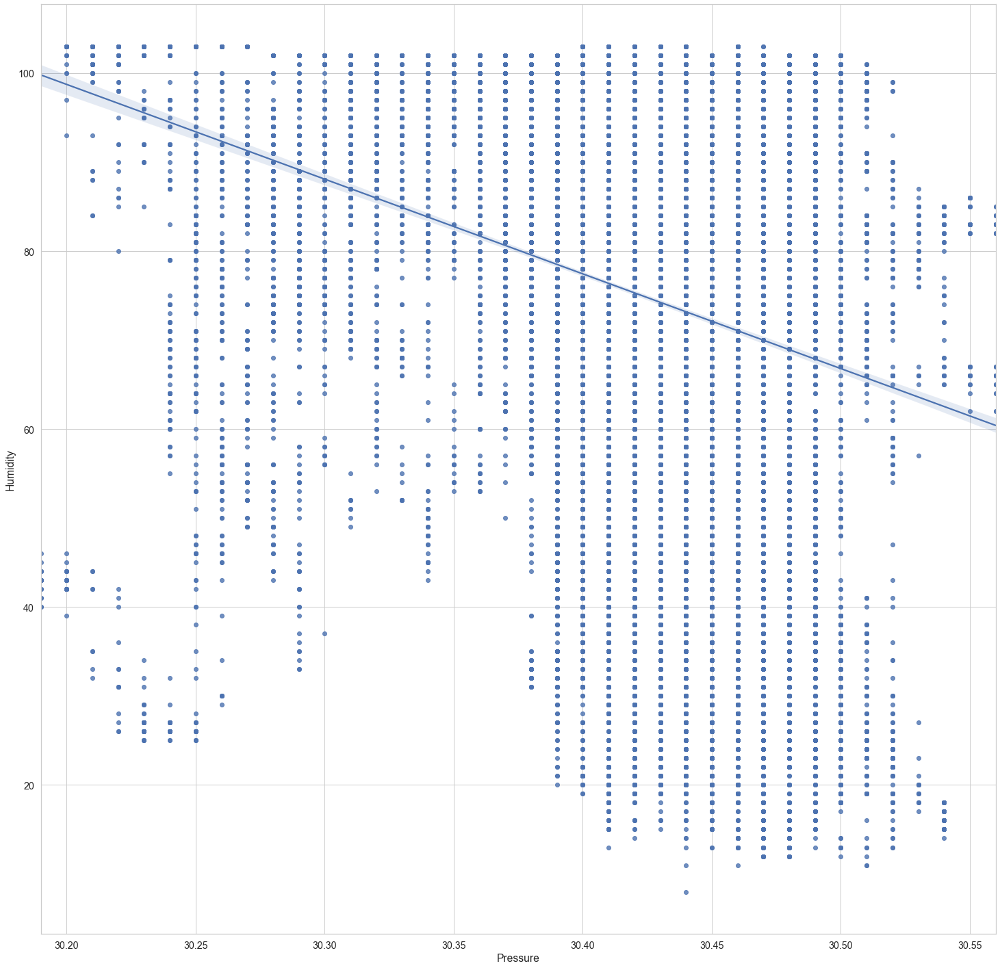

In [27]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['Pressure'],y=data['Humidity'],data=data)

<AxesSubplot:xlabel='Temperature', ylabel='Humidity'>

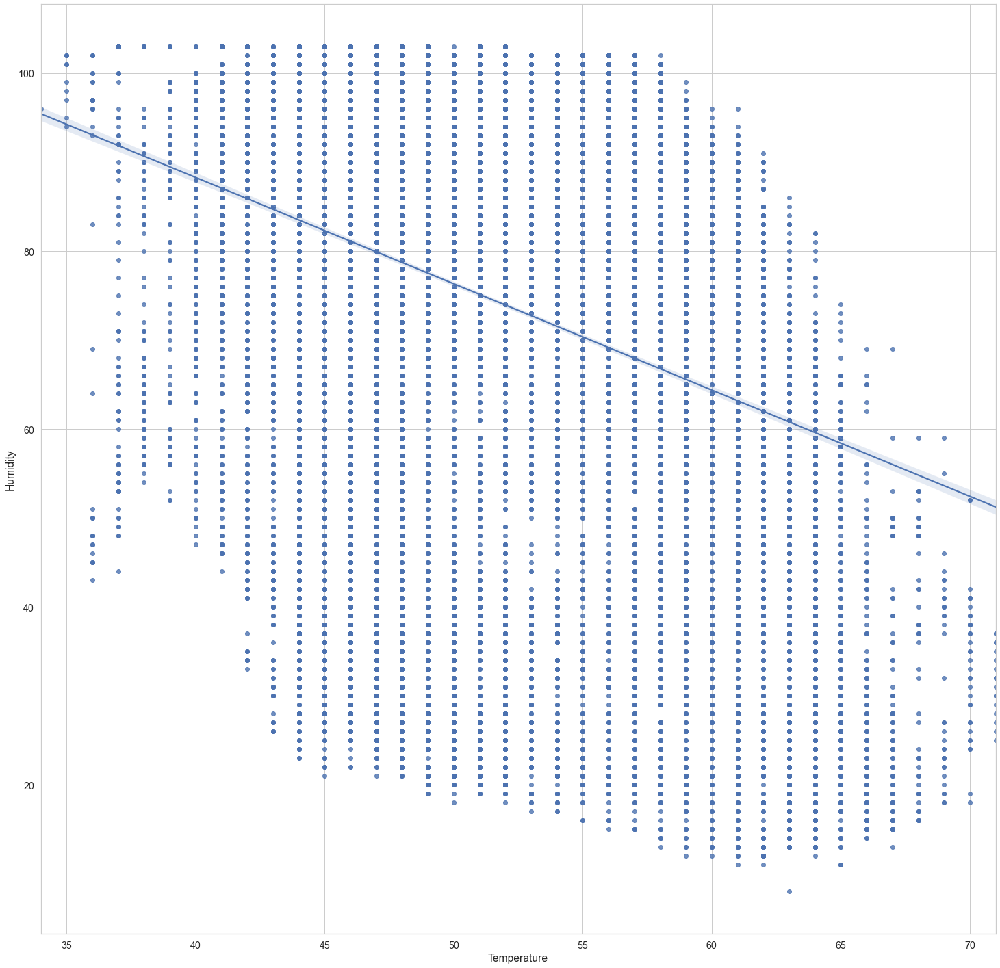

In [28]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['Temperature'],y=data['Humidity'],data=data)

<AxesSubplot:xlabel='Humidity', ylabel='WindDirection(Degrees)'>

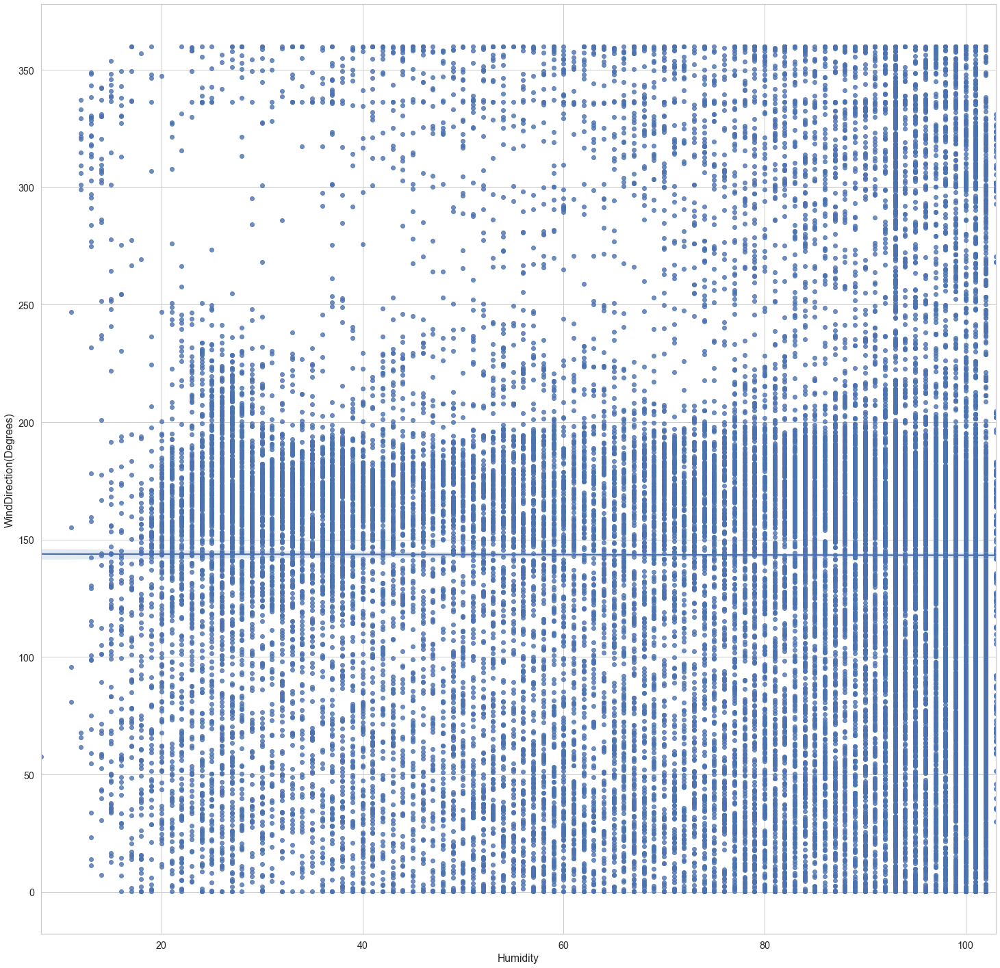

In [29]:
plt.figure(figsize=(25,25))
sns.regplot(x=data['Humidity'],y=data['WindDirection(Degrees)'],data=data)

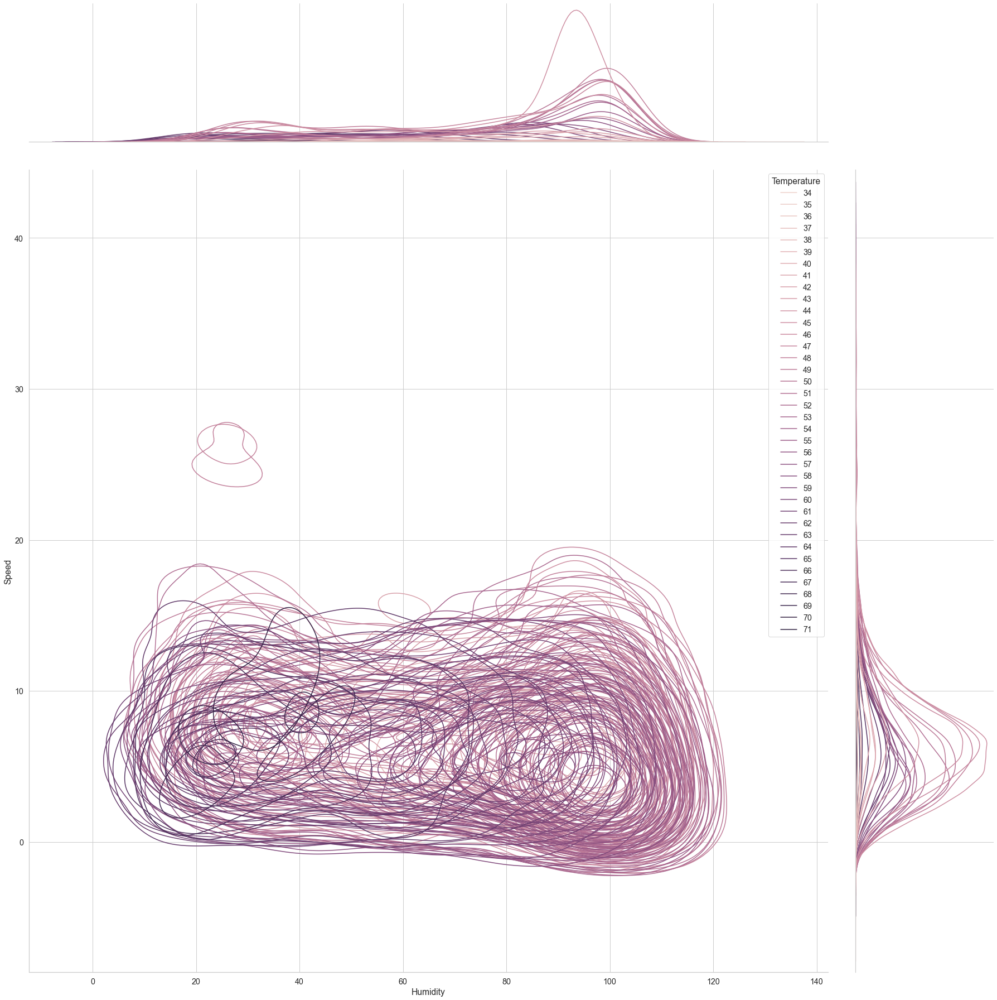

In [37]:
sns.jointplot(
    data=data,
    x=data['Humidity'], y=data['Speed'], hue=data['Temperature'],
    kind="kde", height=25
)

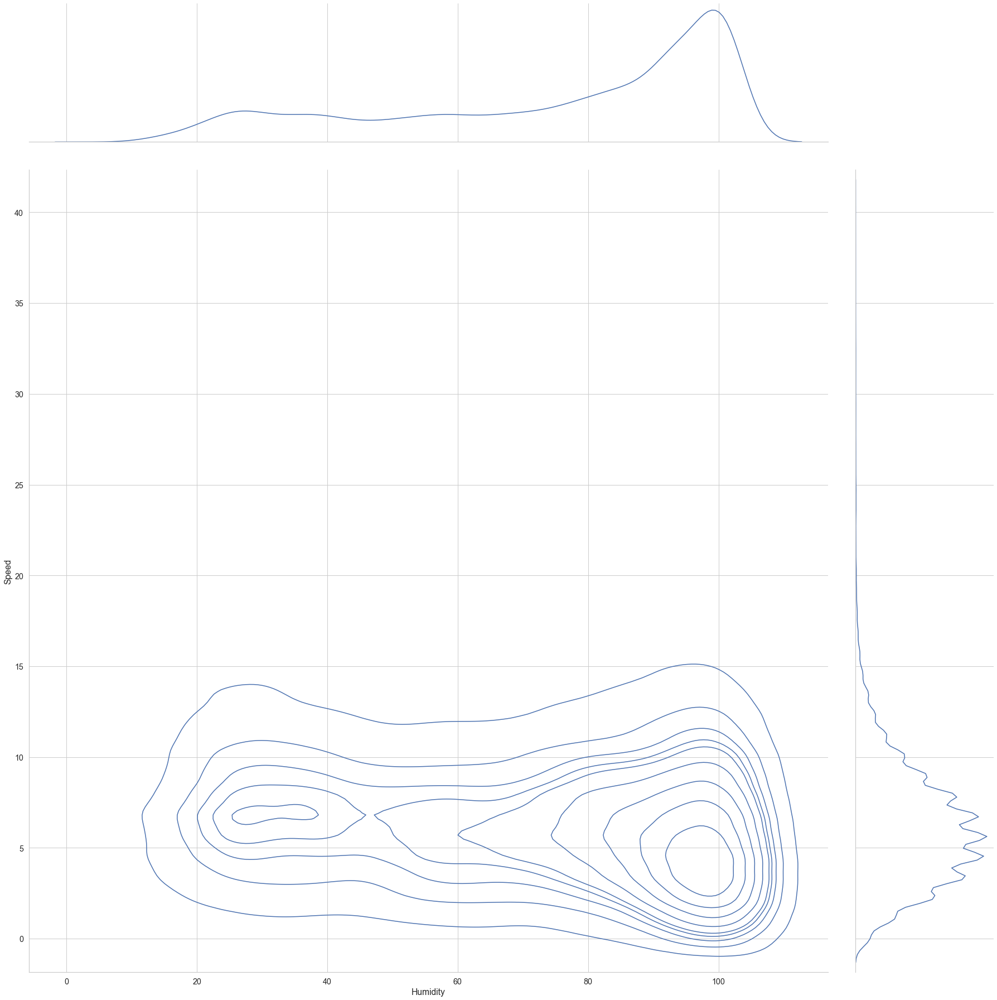

In [38]:
sns.jointplot(
    data=data,
    x=data['Humidity'], y=data['Speed'],
    kind="kde", height=25
)